# Deep learning approches in calssifiying brain ct imagary


In [7]:


pip install plotly


Note: you may need to restart the kernel to use updated packages.


DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


# import essintial libraries

In [28]:
import numpy as np
import pandas as pd

import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np 
import pandas as pd 
import os, random

from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.utils import to_categorical

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report


import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go


from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings('ignore', message="DataFrame is highly fragmented")

import pickle

# load data

In [37]:
base_dir = r'C:\Users\saeed\Downloads\files'


for cls in class_folder_names:
    for file_name in os.listdir(os.path.join(base_dir, cls)):
        if file_name.split('.')[-1] == 'jpg':
            image_paths.append(os.path.join(base_dir, cls, file_name))
print("A total images = ", len(image_paths))
print("-------------------------------")

image_paths[0:5]

A total images =  518
-------------------------------


['C:\\Users\\saeed\\Downloads\\files\\aneurysm\\0.jpg',
 'C:\\Users\\saeed\\Downloads\\files\\aneurysm\\1.jpg',
 'C:\\Users\\saeed\\Downloads\\files\\aneurysm\\10.jpg',
 'C:\\Users\\saeed\\Downloads\\files\\aneurysm\\11.jpg',
 'C:\\Users\\saeed\\Downloads\\files\\aneurysm\\12.jpg']

In [39]:
import os

classes = []

for image_path in image_paths:
    classes.append(image_path.split(os.path.sep)[-2])

classes[0:5]


['aneurysm', 'aneurysm', 'aneurysm', 'aneurysm', 'aneurysm']

# Data loading is done

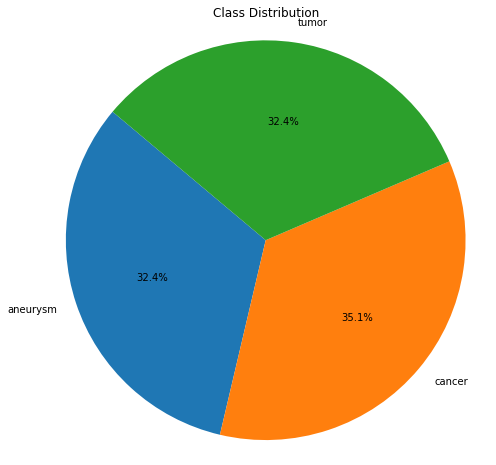

In [8]:
import os
import matplotlib.pyplot as plt

# Define the directory containing your dataset
data_dir = r'C:\Users\saeed\Downloads\files'

# Initialize a dictionary to store class counts
class_counts = {}

# Iterate through subdirectories in the dataset directory
for class_name in os.listdir(data_dir):
    class_path = os.path.join(data_dir, class_name)
    if os.path.isdir(class_path):
        # Count the number of files (samples) in each class
        num_samples = len(os.listdir(class_path))
        class_counts[class_name] = num_samples

# Extract class names and counts
classes = class_counts.keys()
counts = class_counts.values()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(counts, labels=classes, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Set the title
plt.title('Class Distribution')

# Display the pie chart
plt.show()


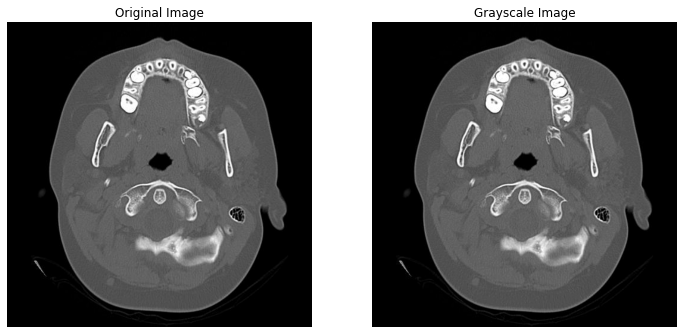

In [14]:
import tensorflow as tf
import matplotlib.pyplot as plt

def load_and_convert_to_grayscale(image_path):
    # Load the image
    image = tf.io.read_file(image_path)
    image = tf.image.decode_image(image, channels=3)
    
    # Convert the image to grayscale
    grayscale_image = tf.image.rgb_to_grayscale(image)
    
    return image, grayscale_image

def display_images(original, grayscale):
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(tf.squeeze(original))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(tf.squeeze(grayscale), cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')
    
    plt.show()

# Example usage
image_path = r'C:\Users\saeed\Downloads\files\tumor\3.jpg'  # Replace with your image path
original_image, grayscale_image = load_and_convert_to_grayscale(image_path)
display_images(original_image, grayscale_image)


# data preprocessing

In [40]:
inputs = []

for i in  tqdm(image_paths):  # image_paths[0:2]
    image = load_img(i)
    img_array = img_to_array(image)
    inputs.append(img_array)

X = np.array(inputs)

  0%|          | 0/518 [00:00<?, ?it/s]

In [41]:
le = LabelEncoder()
y = le.fit_transform(classes)
y = np.array(y)

print(y)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

print("Train data = ", X_train.shape,  y_train.shape)
print("Test data = ", X_test.shape,  y_test.shape)

Train data =  (414, 512, 512, 3) (414,)
Test data =  (104, 512, 512, 3) (104,)


In [43]:
X_train_flattened = X_train.reshape(X_train.shape[0], -1)
X_test_flattened = X_test.reshape(X_test.shape[0], -1)

print("Flattened Train data = ", X_train_flattened.shape,  y_train.shape)
print("Flattened Test data = ", X_test_flattened.shape,  y_test.shape)

Flattened Train data =  (414, 786432) (414,)
Flattened Test data =  (104, 786432) (104,)


# data visualization

In [44]:
# Create a dictionary to store indices of samples for each class

unique_classes = np.unique(y_train)
class_indices = {class_id: np.where(y_train == class_id)[0] for class_id in unique_classes}
class_indices

{0: array([  0,   1,   2,   7,  13,  17,  24,  25,  26,  32,  34,  37,  40,
         50,  51,  52,  53,  55,  57,  58,  60,  67,  69,  72,  74,  75,
         76,  78,  83,  88,  93,  96,  97,  98, 108, 111, 112, 113, 117,
        118, 125, 129, 131, 137, 138, 139, 141, 142, 144, 150, 151, 158,
        159, 161, 162, 163, 165, 175, 180, 181, 183, 188, 191, 203, 207,
        210, 212, 214, 216, 220, 221, 222, 225, 227, 229, 232, 237, 238,
        239, 242, 248, 250, 251, 254, 258, 261, 266, 267, 273, 274, 275,
        276, 287, 293, 295, 296, 297, 299, 300, 303, 304, 311, 314, 317,
        323, 325, 328, 331, 335, 338, 343, 344, 348, 350, 351, 354, 360,
        363, 366, 367, 371, 373, 374, 375, 381, 382, 389, 391, 392, 393,
        398, 399, 402, 403, 409, 412], dtype=int64),
 1: array([  4,   5,   8,  10,  15,  16,  18,  21,  22,  27,  29,  33,  38,
         39,  42,  43,  48,  49,  63,  66,  68,  70,  77,  81,  85,  86,
         89,  90,  91,  94,  95,  99, 102, 105, 106, 109, 114, 11

In [45]:
# ploting total samples for each class

images_count = [len(class_indices[key]) for key in class_indices.keys()]

fig = px.bar(x=class_folder_names, y=images_count, color= class_folder_names)

fig.update_layout(xaxis_title='Disease', yaxis_title='Count', title="Total samples for each class", )
fig.update_traces(texttemplate='%{y}', textposition='inside')

fig.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


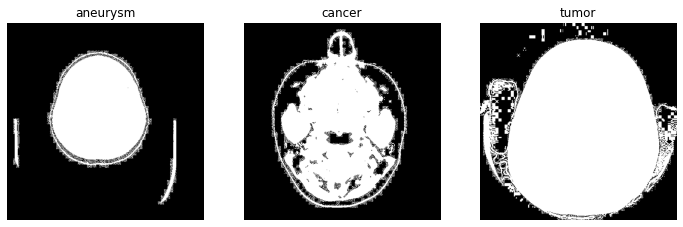

In [46]:
# Displaying sample images for each class randomly.

plt.figure(figsize=(12, 5))

for i, (class_id, indices) in enumerate(class_indices.items()):
    random_index = np.random.choice(indices)
    random_image = X_train[random_index] 

    plt.subplot(1, len(unique_classes), i + 1)
    plt.imshow(random_image)
    plt.title(class_folder_names[class_id])
    plt.axis('off')

plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

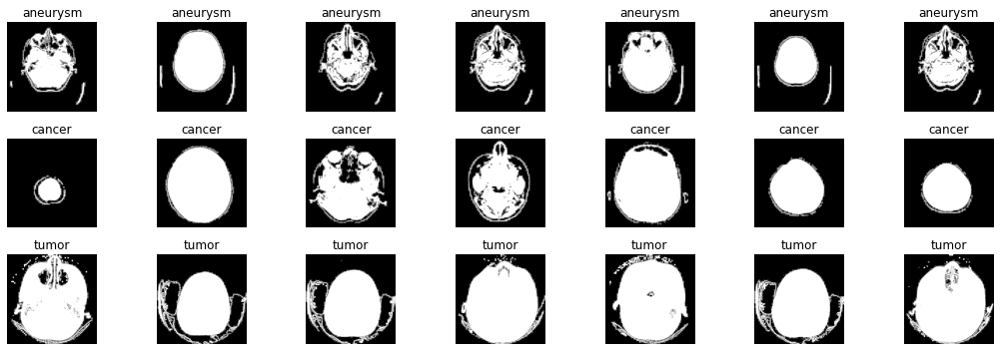

In [47]:
# Displaying 7 sample images for each class randomly.

selected_classes = [0, 1, 2]
total_images_per_class = 7

plt.figure(figsize=(15, 5))

for c, selected_class in enumerate(selected_classes):
    
    # Get indices of samples for the selected class
    indices_for_selected_class = np.where(y_train == selected_class)[0]
    random_indices = np.random.choice(indices_for_selected_class, total_images_per_class, replace=False)

    # Display images for the current selected class
    for i, idx in enumerate(random_indices):
        plt.subplot(3, 7, c * total_images_per_class + i + 1)
        plt.imshow(X_train[idx])
        plt.title(class_folder_names[selected_class])
        plt.axis('off')

plt.tight_layout()
plt.show()

In [48]:
# Reshape the image data to a 2D array
num_samples, height, width, channels = X_train.shape

X_train_reshaped = X_train.reshape(num_samples, height * width * channels)
X_train_flattened.shape

(414, 786432)

In [49]:
# Apply PCA to reduce dimensions to 2 for visualization

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_flattened)
X_train_pca.shape

(414, 2)

In [50]:
# Visualize the PCA-transformed data

hover_text = [f"Index: {index}" for index in range(len(X_train_pca))]

fig = px.scatter(x=X_train_pca[:, 0], y=X_train_pca[:, 1], color=y_train, hover_name=hover_text, symbol=y_train, title='PCA Visualization of Image Classes')
fig.update_traces(marker=dict(size=15))
fig.update_layout(xaxis_title='Principal Component 1', yaxis_title='Principal Component 2')
fig.update_layout(coloraxis_showscale=False)

fig.show()

In [51]:
# Finding outliers by talking high distance sum values

pca_sums = np.sum(X_train_pca, axis=1)

outlier_indexes = []
for idx, row in enumerate(pca_sums):
    if row>15000:
        print(row, idx)
        outlier_indexes.append(idx)

41640.91 79
132706.44 91
42407.023 92
43289.82 104
49224.023 133
43289.82 134
201296.3 135
49224.023 153
201296.3 176
133923.42 180
132706.44 211
201296.3 216
42407.023 217
201296.3 229
201296.3 261
41640.91 339
42128.367 359
201296.3 360
52229.617 365
201296.3 381
42128.363 411
201296.3 413


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

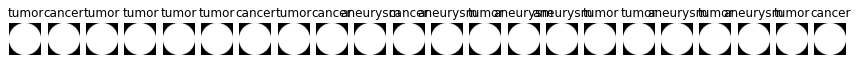

In [52]:
# Displaying outlier images

plt.figure(figsize=(15, 4))

for i, outlier in enumerate(outlier_indexes):
    outlier_image = X_train[outlier] 

    plt.subplot(1, len(outlier_indexes), i+1)
    plt.imshow(outlier_image)
    title = class_folder_names[y_train[outlier]]
    plt.title(title)
    plt.axis('off')

plt.show()

In [53]:
pca_df = pd.DataFrame(data=X_train_pca, columns=['PC1', 'PC2'])
pca_df['Class'] = y_train
pca_df['Index'] = pca_df.index
pca_df.head()

,PC1,PC2,Class,Index
0,-18864.894531,19013.181641,0,0
1,-22804.798828,16607.777344,0,1
2,-24439.041016,15335.854492,0,2
3,6249.457520,-9297.083984,2,3
4,30452.632812,-28916.132812,1,4


# train the model

In [55]:
models = {
    'Random Forest': RandomForestClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Logistic Regression': LogisticRegression(),
    'SVM': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),

}

In [56]:
accuracies = {}

for name, model in models.items():
    
    model.fit(X_train_flattened, y_train)        
    predictions = model.predict(X_test_flattened)
    
    accuracy = accuracy_score(y_test, predictions)
    accuracies[name] = accuracy

    print(f"{name} accuracy: {accuracy}")


Random Forest accuracy: 0.9903846153846154
Decision Tree accuracy: 0.9903846153846154
Logistic Regression accuracy: 0.9903846153846154
SVM accuracy: 0.9807692307692307
K-Nearest Neighbors accuracy: 0.9807692307692307


In [57]:
# Find the best model based on accuracy
best_model_name = max(accuracies, key=accuracies.get)
best_model = models[best_model_name]

print("Best model = ", best_model )

Best model =  RandomForestClassifier()


In [58]:
# Train the best model
best_model.fit(X_train_flattened, y_train)
best_predictions = best_model.predict(X_test_flattened)

best_predictions

array([0, 0, 0, 2, 2, 2, 1, 0, 1, 1, 1, 1, 1, 2, 1, 0, 2, 0, 0, 1, 1, 0,
       1, 0, 1, 2, 1, 0, 0, 1, 0, 2, 1, 1, 2, 0, 2, 1, 1, 2, 2, 1, 1, 2,
       1, 0, 2, 0, 0, 0, 0, 2, 1, 2, 1, 0, 1, 1, 2, 2, 2, 2, 0, 0, 0, 1,
       2, 1, 0, 2, 1, 2, 0, 0, 0, 1, 2, 2, 1, 0, 2, 1, 2, 1, 0, 1, 0, 1,
       2, 1, 1, 0, 1, 1, 1, 2, 0, 0, 0, 2, 1, 1, 1, 2], dtype=int64)

In [59]:
# Get weights

if best_model_name == 'Random Forest' or best_model_name == 'Decision Tree':
    coefficients = best_model.feature_importances_
    print(coefficients.shape)

elif best_model_name == 'Logistic Regression':
    coefficients = best_model.coef_.ravel()
    print(coefficients.shape)
else:
    coefficients = None

(786432,)


In [60]:
# ploting weights distribution

if coefficients is not None:
    fig = px.histogram(x=coefficients, nbins=50, labels={'x': 'Coefficient Value'}, title='Distribution of Coefficients (Weights)')
    fig.update_layout(bargap=0.1)
    fig.update_traces(opacity=0.7)
    fig.show()

# ML Model Training is done.

# report

In [61]:
report = classification_report(y_test, best_predictions)
print(report)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        32
           1       1.00      0.98      0.99        42
           2       1.00      1.00      1.00        30

    accuracy                           0.99       104
   macro avg       0.99      0.99      0.99       104
weighted avg       0.99      0.99      0.99       104



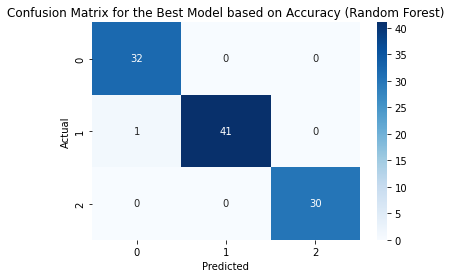

In [62]:
# Calculate and display the confusion matrix for the best model
cm = confusion_matrix(y_test, best_predictions)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=True, yticklabels=True)
plt.title(f'Confusion Matrix for the Best Model based on Accuracy ({best_model_name})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [63]:
# Save the trained model
with open('best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

In [64]:
# Load the saved model
with open('best_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

loaded_model

RandomForestClassifier()

In [65]:
# Predicting on loaded model with X_test_flattened

predictions = loaded_model.predict(X_test_flattened)
predictions

array([0, 0, 0, 2, 2, 2, 1, 0, 1, 1, 1, 1, 1, 2, 1, 0, 2, 0, 0, 1, 1, 0,
       1, 0, 1, 2, 1, 0, 0, 1, 0, 2, 1, 1, 2, 0, 2, 1, 1, 2, 2, 1, 1, 2,
       1, 0, 2, 0, 0, 0, 0, 2, 1, 2, 1, 0, 1, 1, 2, 2, 2, 2, 0, 0, 0, 1,
       2, 1, 0, 2, 1, 2, 0, 0, 0, 1, 2, 2, 1, 0, 2, 1, 2, 1, 0, 1, 0, 1,
       2, 1, 1, 0, 1, 1, 1, 2, 0, 0, 0, 2, 1, 1, 1, 2], dtype=int64)

In [67]:
import os
import random

random_image_path = random.choice(image_paths)
actual_class = os.path.basename(os.path.dirname(random_image_path))

print("Random Image Path =", random_image_path)
print("Actual Class =", actual_class)


Random Image Path = C:\Users\saeed\Downloads\files\cancer\75.jpg
Actual Class = cancer


In [68]:
# Image preprocessing for prediction

random_image = load_img(random_image_path)
random_img_array = img_to_array(random_image)

flattend_img_array = random_img_array.reshape(1, -1)
flattend_img_array.shape

(1, 786432)

Random Image Path = C:\Users\saeed\Downloads\files\tumor\6.jpg
Actual Class = tumor


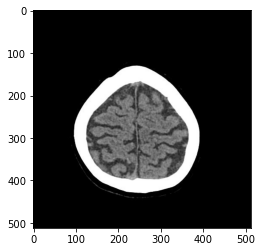

In [71]:
import os
import random

# Your existing code here to define image_paths and class_folder_names

# Randomly choose an image path
random_image_path = random.choice(image_paths)

# Get the actual class from the random image path
actual_class = os.path.basename(os.path.dirname(random_image_path))

# Print information
print("Random Image Path =", random_image_path)
print("Actual Class =", actual_class)

# Your existing code here to display the random image
plt.imshow(random_image)
plt.show()

# Your existing code here to make predictions and display results


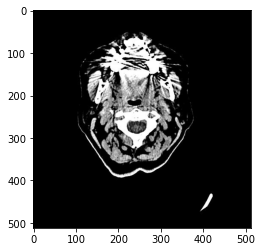

In [13]:
image = plt.imread(r'C:\Users\saeed\Downloads\files\aneurysm\0.jpg')
plt.imshow(image)

In [14]:
pip install opencv-python


   ---------------------------------------- 38.1/38.1 MB 5.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 24.0 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063

[notice] A new release of pip is available: 23.3.1 -> 23.3.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [15]:
import cv2

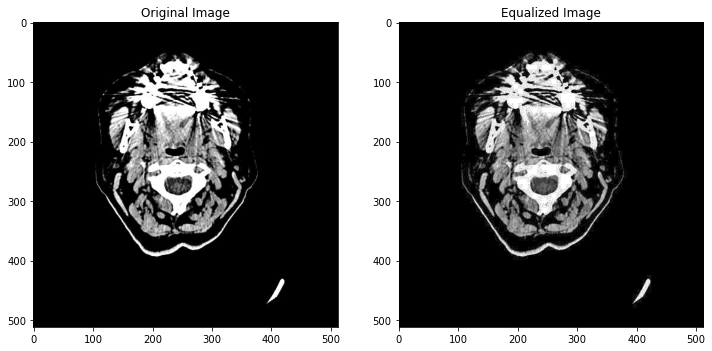

In [16]:
image = cv2.imread(r'C:\Users\saeed\Downloads\files\aneurysm\0.jpg', cv2.IMREAD_GRAYSCALE)
equalized_image = cv2.equalizeHist(image)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Equalized Image')
plt.imshow(equalized_image, cmap='gray')

plt.show()

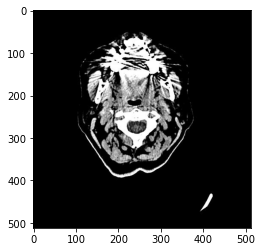

In [17]:
image = plt.imread(r'C:\Users\saeed\Downloads\files\aneurysm\0.jpg')
plt.imshow(image)

In [18]:
image.shape

(512, 512, 3)

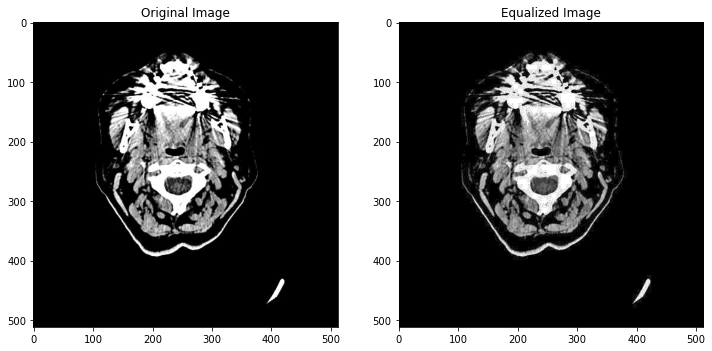

In [22]:
import cv2
import matplotlib.pyplot as plt

# Load the image using cv2.imread in grayscale
image = cv2.imread(r'C:\Users\saeed\Downloads\files\aneurysm\0.jpg', cv2.IMREAD_GRAYSCALE)

# Equalize the histogram
equalized_image = cv2.equalizeHist(image)

# Display the original and equalized images side by side
plt.figure(figsize=(12, 6))

# Original Image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')

# Equalized Image
plt.subplot(1, 2, 2)
plt.title('Equalized Image')
plt.imshow(equalized_image, cmap='gray')

# Show the plot
plt.show()


In [ ]:
image = plt.imread('/kaggle/input/computed-tomography-ct-of-the-brain/files/tumor/0.jpg')
plt.imshow(image)

# VGG16

In [21]:
# from tensorflow.keras.applications import VGG16
# from tensorflow.keras.layers import Dense, Flatten, Dropout
# from tensorflow.keras.models import Model
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# import os
# # Path to your 'files' directory
# base_dir = 'C:/Users/saeed/Downloads/files'

# # Load the VGG16 model pre-trained on ImageNet data, without the top layer
# vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# # Freeze the layers of VGG16
# for layer in vgg.layers:
#     layer.trainable = False

# # Adding custom layers
# x = Flatten()(vgg.output)
# x = Dense(1024, activation='relu')(x)
# x = Dropout(0.5)(x)
# x = Dense(3, activation='softmax')(x)  # 3 classes: tumor, cancer, aneurysm

# # Creating the final model
# model = Model(inputs=vgg.input, outputs=x)

# # Compile the model with the updated learning rate parameter
# model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# # Data augmentation for training
# train_datagen = ImageDataGenerator(rescale=1./255, 
#                                    rotation_range=40, 
#                                    width_shift_range=0.2, 
#                                    height_shift_range=0.2, 
#                                    shear_range=0.2, 
#                                    zoom_range=0.2, 
#                                    horizontal_flip=True,
#                                    fill_mode='nearest')

# # Data generator for training
# train_generator = train_datagen.flow_from_directory(
#         base_dir,  # This is the target directory
#         target_size=(224, 224),  # All images will be resized to 224x224
#         batch_size=20,
#         class_mode='categorical')  # Since we use categorical_crossentropy loss, we need categorical labels

# # Number of images in the dataset
# total_images = 259  # Adjust this number based on your actual dataset
# batch_size = 20

# # Adjusted steps per epoch
# steps_per_epoch = total_images // batch_size

# # Train the model with adjusted steps per epoch
# history = model.fit(
#       train_generator,
#       steps_per_epoch=steps_per_epoch,
#       epochs=15,
#       verbose=1)


Found 259 images belonging to 3 classes.
Epoch 1/15
12/12 [==============================] - 52s 4s/step - loss: 1.0077 - accuracy: 0.5649
Epoch 2/15
12/12 [==============================] - 51s 4s/step - loss: 0.5204 - accuracy: 0.8368
Epoch 3/15
12/12 [==============================] - 53s 4s/step - loss: 0.3429 - accuracy: 0.8745
Epoch 4/15
12/12 [==============================] - 52s 4s/step - loss: 0.3394 - accuracy: 0.8745
Epoch 5/15
12/12 [==============================] - 54s 4s/step - loss: 0.1359 - accuracy: 0.9542
Epoch 6/15
12/12 [==============================] - 53s 5s/step - loss: 0.1972 - accuracy: 0.9498
Epoch 7/15
12/12 [==============================] - 51s 4s/step - loss: 0.1519 - accuracy: 0.9414
Epoch 8/15
12/12 [==============================] - 52s 4s/step - loss: 0.1065 - accuracy: 0.9707
Epoch 9/15
12/12 [==============================] - 56s 5s/step - loss: 0.1140 - accuracy: 0.9665
Epoch 10/15
12/12 [==============================] - 55s 4s/step - loss: 0.10

In [56]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Path to your 'files' directory
base_dir = 'C:/Users/saeed/Downloads/files'

# Load the VGG16 model pre-trained on ImageNet data, without the top layer
vgg = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of VGG16
for layer in vgg.layers:
    layer.trainable = False

# Adding custom layers
x = Flatten()(vgg.output)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(3, activation='softmax')(x)  # 3 classes: tumor, cancer, aneurysm

# Creating the final model
model = Model(inputs=vgg.input, outputs=x)

# Compile the model with the updated optimizer (SGD)
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])

# Data augmentation for training
train_datagen = ImageDataGenerator(rescale=1./255, 
                                   rotation_range=40, 
                                   width_shift_range=0.2, 
                                   height_shift_range=0.2, 
                                   shear_range=0.2, 
                                   zoom_range=0.2, 
                                   horizontal_flip=True,
                                   fill_mode='nearest')

# Data generator for training
train_generator = train_datagen.flow_from_directory(
        base_dir,  # This is the target directory
        target_size=(224, 224),  # All images will be resized to 224x224
        batch_size=20,
        class_mode='categorical')  # Since we use categorical_crossentropy loss, we need categorical labels

# Number of images in the dataset
total_images = 259  # Adjust this number based on your actual dataset
batch_size = 20

# Adjusted steps per epoch
steps_per_epoch = total_images // batch_size

# Train the model with adjusted steps per epoch
history = model.fit(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=15,
      verbose=1)


Found 259 images belonging to 3 classes.
Epoch 1/15
12/12 [==============================] - 27s 2s/step - loss: 1.3478 - accuracy: 0.4017
Epoch 2/15
12/12 [==============================] - 24s 2s/step - loss: 1.1241 - accuracy: 0.4519
Epoch 3/15
12/12 [==============================] - 25s 2s/step - loss: 0.9531 - accuracy: 0.5565
Epoch 4/15
12/12 [==============================] - 26s 2s/step - loss: 0.7847 - accuracy: 0.6611
Epoch 5/15
12/12 [==============================] - 26s 2s/step - loss: 0.7418 - accuracy: 0.6904
Epoch 6/15
12/12 [==============================] - 26s 2s/step - loss: 0.7263 - accuracy: 0.6946
Epoch 7/15
12/12 [==============================] - 26s 2s/step - loss: 0.6268 - accuracy: 0.7490
Epoch 8/15
12/12 [==============================] - 50s 4s/step - loss: 0.6456 - accuracy: 0.7364
Epoch 9/15
12/12 [==============================] - 51s 4s/step - loss: 0.5531 - accuracy: 0.7950
Epoch 10/15
12/12 [==============================] - 50s 4s/step - loss: 0.57

# resnet50

In [53]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Load the ResNet50 model pre-trained on ImageNet data, without the top layer
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of ResNet50
for layer in resnet.layers:
    layer.trainable = False

# Adding custom layers
x = GlobalAveragePooling2D()(resnet.output)
x = Dense(1024, activation='relu')(x)
x = Dense(3, activation='softmax')(x)  # 3 classes

# Creating the final model
resnet_model = Model(inputs=resnet.input, outputs=x)

# Compile the model
resnet_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the ResNet model
history_resnet = resnet_model.fit(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=15,
      verbose=1)




Epoch 1/15
12/12 [==============================] - 14s 925ms/step - loss: 1.0328 - accuracy: 0.4728
Epoch 2/15
12/12 [==============================] - 11s 924ms/step - loss: 0.7948 - accuracy: 0.7448
Epoch 3/15
12/12 [==============================] - 11s 942ms/step - loss: 0.6844 - accuracy: 0.7573
Epoch 4/15
12/12 [==============================] - 12s 951ms/step - loss: 0.6183 - accuracy: 0.7699
Epoch 5/15
12/12 [==============================] - 12s 1s/step - loss: 0.5372 - accuracy: 0.8117
Epoch 6/15
12/12 [==============================] - 12s 948ms/step - loss: 0.5089 - accuracy: 0.8243
Epoch 7/15
12/12 [==============================] - 12s 953ms/step - loss: 0.4897 - accuracy: 0.8033
Epoch 8/15
12/12 [==============================] - 12s 979ms/step - loss: 0.4489 - accuracy: 0.8410
Epoch 9/15
12/12 [==============================] - 11s 937ms/step - loss: 0.4465 - accuracy: 0.8285
Epoch 10/15
12/12 [==============================] - 12s 967ms/step - loss: 0.4080 - accuracy:

# CNN

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define the directory containing your dataset
data_dir = r'C:\Users\saeed\Downloads\files'

# Define the image size and batch size
img_size = (224, 224)
batch_size = 32

# Define the number of classes in your dataset
num_classes = 3  # Replace with the actual number of classes in your dataset

# Create data generators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,  # Adjust the validation split as needed
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
)

# Create a CNN model with more convolutional layers
model = Sequential()

model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_size[0], img_size[1], 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Additional convolutional layers
model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(512, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature maps
model.add(Flatten())

# Add fully connected layers
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // batch_size,
    validation_data=val_generator,
    validation_steps=val_generator.samples // batch_size,
    epochs=10  # Adjust the number of epochs as needed
)


Found 209 images belonging to 3 classes.
Found 50 images belonging to 3 classes.
Epoch 1/10
6/6 [==============================] - 9s 1s/step - loss: 1.0767 - accuracy: 0.3277 - val_loss: 1.0615 - val_accuracy: 0.4375
Epoch 2/10
6/6 [==============================] - 7s 1s/step - loss: 1.0484 - accuracy: 0.4237 - val_loss: 1.0347 - val_accuracy: 0.4375
Epoch 3/10
6/6 [==============================] - 8s 1s/step - loss: 1.0062 - accuracy: 0.4792 - val_loss: 0.9988 - val_accuracy: 0.4688
Epoch 4/10
6/6 [==============================] - 7s 1s/step - loss: 0.9548 - accuracy: 0.4802 - val_loss: 0.8922 - val_accuracy: 0.4375
Epoch 5/10
6/6 [==============================] - 7s 1s/step - loss: 0.9010 - accuracy: 0.5085 - val_loss: 0.9841 - val_accuracy: 0.3750
Epoch 6/10
6/6 [==============================] - 7s 1s/step - loss: 0.8175 - accuracy: 0.6780 - val_loss: 0.6944 - val_accuracy: 0.7812
Epoch 7/10
6/6 [==============================] - 7s 1s/step - loss: 0.7980 - accuracy: 0.6045 - 